In [ ]:
from IPython import get_ipython
from IPython.display import display
import os
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from pycocotools.coco import COCO
from skimage.transform import resize
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
import torchvision
from torchvision.models.segmentation.deeplabv3 import DeepLabV3_ResNet101_Weights
from torchvision.models.segmentation import deeplabv3_resnet101

In [ ]:
# Import and mount Google Drive.

from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
# Unzip the dataset file and store it in a folder called coco_data

!unzip "/content/drive/MyDrive/RM_Segmentation_Assignment_dataset.zip" -d "/content/coco_data/"

Archive:  /content/drive/MyDrive/RM_Segmentation_Assignment_dataset.zip
  inflating: /content/coco_data/test-30/000000001751.jpg  
  inflating: /content/coco_data/test-30/000000001380.jpg  
  inflating: /content/coco_data/test-30/000000001643.jpg  
  inflating: /content/coco_data/test-30/000000001583.jpg  
  inflating: /content/coco_data/test-30/000000001685.jpg  
  inflating: /content/coco_data/test-30/000000001482.jpg  
  inflating: /content/coco_data/test-30/000000001494.jpg  
  inflating: /content/coco_data/test-30/000000001551.jpg  
  inflating: /content/coco_data/test-30/000000001654.jpg  
  inflating: /content/coco_data/test-30/000000001594.jpg  
  inflating: /content/coco_data/test-30/000000001411.jpg  
  inflating: /content/coco_data/test-30/000000001459.jpg  
  inflating: /content/coco_data/test-30/000000001410.jpg  
  inflating: /content/coco_data/test-30/000000001717.jpg  
  inflating: /content/coco_data/test-30/000000001730.jpg  
  inflating: /content/coco_data/validation-

In [ ]:
target_classes = ["cake", "car", "dog", "person"]

train_path = "/content/coco_data/train-300"
val_path = "/content/coco_data/validation-300"
test_path = "/content/coco_data/test-30"

In [ ]:
train_annot = os.path.join(train_path, "labels.json")
val_annot = os.path.join(val_path, "labels.json")
train_coco = COCO(train_annot)
val_coco = COCO(val_annot)

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
loading annotations into memory...
Done (t=0.03s)
creating index...
index created!


In [ ]:
# Count images in downloaded data folders
def count_images(folder_path):
    image_extensions = ['.jpg', '.jpeg', '.png']  # Add other extensions if needed
    count = 0
    if os.path.exists(folder_path):
        for filename in os.listdir(folder_path):
            if any(filename.lower().endswith(ext) for ext in image_extensions):
                count += 1
    return count

In [ ]:
train_data_images = count_images(os.path.join('/content/coco_data/', 'train-300/data'))
val_data_images = count_images(os.path.join('/content/coco_data/', 'validation-300/data'))
test_data_images = count_images(os.path.join('/content/coco_data/', 'test-30'))


print(f"Images in train folder: {train_data_images}")
print(f"Images in validation folder: {val_data_images}")
print(f"Images in test folder: {test_data_images}")



Images in train folder: 300
Images in validation folder: 300
Images in test folder: 30


In [ ]:
# Get all category ids and names
categories = train_coco.loadCats(train_coco.getCatIds())
category_names = [cat['name'] for cat in categories]

# Count annotations per category for training data
train_cat_counts = {}
for cat_name in category_names:
    cat_id = train_coco.getCatIds(catNms=[cat_name])
    img_ids = train_coco.getImgIds(catIds=cat_id)
    ann_ids = train_coco.getAnnIds(imgIds=img_ids, catIds=cat_id)
    train_cat_counts[cat_name] = len(ann_ids)

print("\nTraining dataset category counts:")
for cat, count in train_cat_counts.items():
    print(f"{cat}: {count}")


Training dataset category counts:
airplane: 15
backpack: 84
banana: 15
baseball bat: 6
baseball glove: 12
bear: 3
bench: 49
bicycle: 125
bird: 57
boat: 20
book: 2
bottle: 10
bowl: 10
broccoli: 1
bus: 91
cake: 13
car: 1061
carrot: 4
cat: 4
cell phone: 19
chair: 51
clock: 17
cow: 1
cup: 21
dining table: 25
dog: 14
donut: 4
elephant: 5
fire hydrant: 9
fork: 6
frisbee: 3
giraffe: 1
handbag: 72
horse: 17
hot dog: 3
kite: 55
knife: 4
laptop: 2
motorcycle: 73
oven: 2
parking meter: 9
person: 1350
pizza: 10
potted plant: 9
refrigerator: 2
remote: 1
sandwich: 6
scissors: 2
skateboard: 30
skis: 11
spoon: 1
sports ball: 23
stop sign: 14
suitcase: 14
surfboard: 15
tennis racket: 7
tie: 12
traffic light: 167
train: 10
truck: 120
umbrella: 68
vase: 1
wine glass: 2


In [ ]:
# Count annotations per category for validation data
val_cat_counts = {}
for cat_name in category_names:
    cat_id = val_coco.getCatIds(catNms=[cat_name])
    img_ids = val_coco.getImgIds(catIds=cat_id)
    ann_ids = val_coco.getAnnIds(imgIds=img_ids, catIds=cat_id)
    val_cat_counts[cat_name] = len(ann_ids)

print("\nValidation dataset category counts:")
for cat, count in val_cat_counts.items():
    print(f"{cat}: {count}")



Validation dataset category counts:
airplane: 5
backpack: 46
banana: 10
baseball bat: 6
baseball glove: 5
bear: 3774
bench: 34
bicycle: 71
bird: 2
boat: 45
book: 34
bottle: 59
bowl: 16
broccoli: 3774
bus: 110
cake: 18
car: 861
carrot: 1
cat: 7
cell phone: 12
chair: 124
clock: 17
cow: 3774
cup: 62
dining table: 68
dog: 9
donut: 2
elephant: 2
fire hydrant: 19
fork: 24
frisbee: 5
giraffe: 8
handbag: 71
horse: 8
hot dog: 14
kite: 17
knife: 27
laptop: 3774
motorcycle: 89
oven: 2
parking meter: 12
person: 1191
pizza: 100
potted plant: 25
refrigerator: 2
remote: 2
sandwich: 1
scissors: 3774
skateboard: 11
skis: 2
spoon: 12
sports ball: 9
stop sign: 11
suitcase: 35
surfboard: 3
tennis racket: 12
tie: 8
traffic light: 195
train: 14
truck: 127
umbrella: 31
vase: 11
wine glass: 19


In [ ]:
# Get image sizes from the training dataset
img_ids_train = train_coco.getImgIds()
img_sizes_train = []
for img_id in img_ids_train:
    img_info = train_coco.loadImgs(img_id)[0]
    img_sizes_train.append((img_info['width'], img_info['height']))

# Get image sizes from the validation dataset
img_ids_val = val_coco.getImgIds()
img_sizes_val = []
for img_id in img_ids_val:
    img_info = val_coco.loadImgs(img_id)[0]
    img_sizes_val.append((img_info['width'], img_info['height']))

# Convert sizes to numpy arrays for easier analysis
img_sizes_train = np.array(img_sizes_train)
img_sizes_val = np.array(img_sizes_val)

print("\nTraining dataset image size statistics:")
print(f"Number of images: {len(img_sizes_train)}")
print(f"Mean size (width, height): {np.mean(img_sizes_train, axis=0)}")
print(f"Median size (width, height): {np.median(img_sizes_train, axis=0)}")
print(f"Min size (width, height): {np.min(img_sizes_train, axis=0)}")
print(f"Max size (width, height): {np.max(img_sizes_train, axis=0)}")


Training dataset image size statistics:
Number of images: 300
Mean size (width, height): [595.29666667 475.39666667]
Median size (width, height): [640. 480.]
Min size (width, height): [333 270]
Max size (width, height): [640 640]


In [ ]:
print("\nValidation dataset image size statistics:")
print(f"Number of images: {len(img_sizes_val)}")
print(f"Mean size (width, height): {np.mean(img_sizes_val, axis=0)}")
print(f"Median size (width, height): {np.median(img_sizes_val, axis=0)}")
print(f"Min size (width, height): {np.min(img_sizes_val, axis=0)}")
print(f"Max size (width, height): {np.max(img_sizes_val, axis=0)}")


Validation dataset image size statistics:
Number of images: 300
Mean size (width, height): [591.94666667 482.85      ]
Median size (width, height): [640. 480.]
Min size (width, height): [299 246]
Max size (width, height): [640 640]


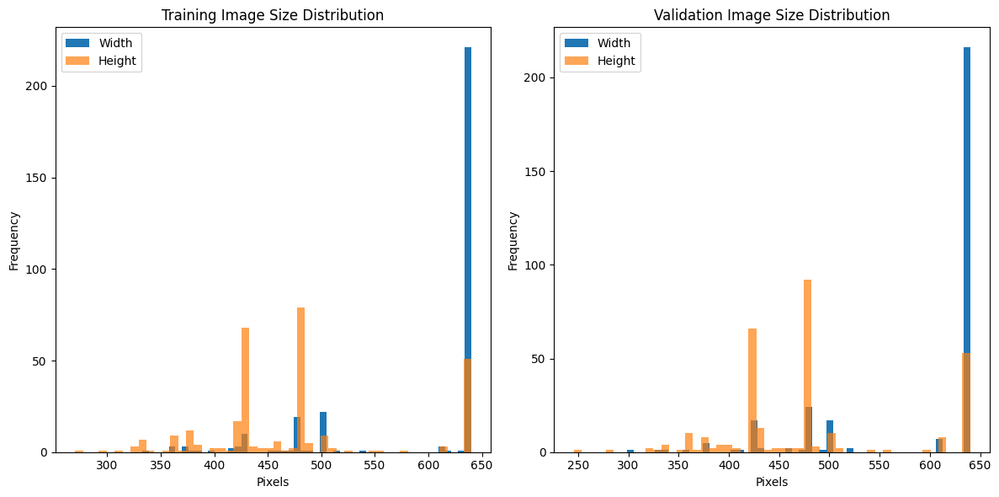

In [ ]:
# Plot distributions
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.hist(img_sizes_train[:, 0], bins=50, label='Width')
plt.hist(img_sizes_train[:, 1], bins=50, label='Height', alpha=0.7)
plt.title('Training Image Size Distribution')
plt.xlabel('Pixels')
plt.ylabel('Frequency')
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(img_sizes_val[:, 0], bins=50, label='Width')
plt.hist(img_sizes_val[:, 1], bins=50, label='Height', alpha=0.7)
plt.title('Validation Image Size Distribution')
plt.xlabel('Pixels')
plt.ylabel('Frequency')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
filtered_classes = ["cake", "car", "dog", "person"]

# Create a DataFrame for training category counts for filtered classes
train_filtered_counts = {cat: count for cat, count in train_cat_counts.items() if cat in filtered_classes}
df_train_filtered = pd.DataFrame(list(train_filtered_counts.items()), columns=['Category', 'Count'])

print("\nTraining dataset filtered category counts:")
print(df_train_filtered)



Training dataset filtered category counts:
  Category  Count
0     cake     13
1      car   1061
2      dog     14
3   person   1350


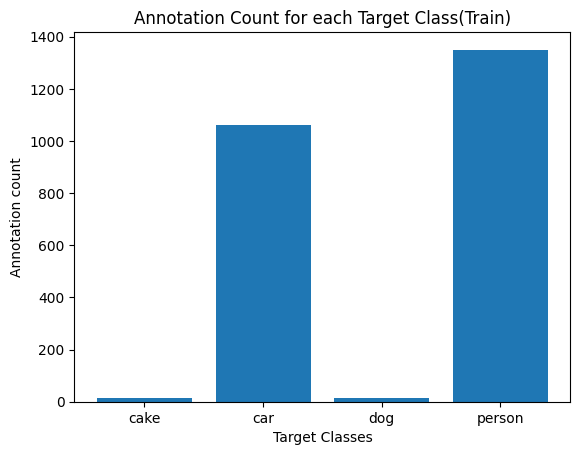

In [ ]:
plt.bar(df_train_filtered['Category'], df_train_filtered['Count'])
plt.xlabel('Target Classes')
plt.ylabel('Annotation count')
plt.title('Annotation Count for each Target Class(Train)')
plt.show()

In [ ]:
# Create a DataFrame for validation category counts for filtered classes
val_filtered_counts = {cat: count for cat, count in val_cat_counts.items() if cat in filtered_classes}
df_val_filtered = pd.DataFrame(list(val_filtered_counts.items()), columns=['Category', 'Count'])

print("\nValidation dataset filtered category counts:")
print(df_val_filtered)



Validation dataset filtered category counts:
  Category  Count
0     cake     18
1      car    861
2      dog      9
3   person   1191


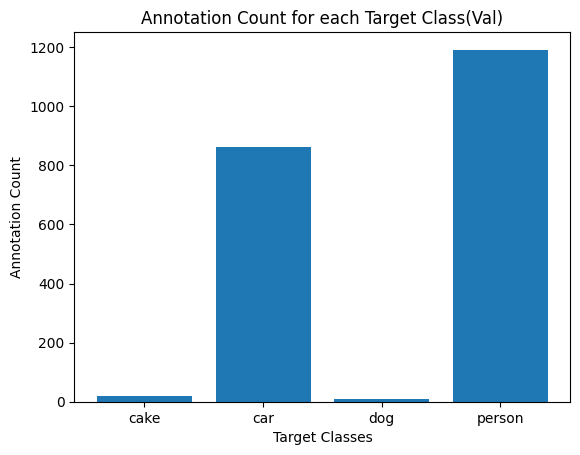

In [ ]:
plt.bar(df_val_filtered['Category'], df_val_filtered['Count'])
plt.xlabel('Target Classes')
plt.ylabel('Annotation Count')
plt.title('Annotation Count for each Target Class(Val)')
plt.show()

In [ ]:

# Number of training images containing the target classes with repetitions
target_classes = ["cake", "car", "dog", "person"]
train_target_classes_IDs = train_coco.getCatIds(catNms=target_classes)
# Oversample underrepresented classes: cake and dog
oversample_factors = {
    "cake": 10,
    "dog": 10,
    "car": 1,
    "person": 1
}

training_images = []

for class_name in target_classes:
    cat_id = train_coco.getCatIds(catNms=class_name)[0]
    img_ids = train_coco.getImgIds(catIds=[cat_id])
    imgs = train_coco.loadImgs(img_ids)

    repeat_factor = oversample_factors.get(class_name, 1)
    training_images += imgs * repeat_factor

print(f"Total training images after oversampling (with repeats): {len(training_images)}")

print(
    f"Category IDs of target classes in the validation set: {train_target_classes_IDs}.\nNumber of training images with target classes including repetitions: {len(training_images)}."
)

Total training images after oversampling (with repeats): 665
Category IDs of target classes in the validation set: [15, 16, 25, 41].
Number of training images with target classes including repetitions: 665.


In [ ]:

# Filter out repeated training images.

unique_training_images = []

for i in range(len(training_images)):
    if training_images[i] not in unique_training_images:
        unique_training_images.append(training_images[i])

# Shuffle the training data.
random.seed(0)
random.shuffle(unique_training_images)

print(
    f"Number of unique images in training data containing the target classes: {len(unique_training_images)}"
)

Number of unique images in training data containing the target classes: 300


In [ ]:
target_classes = ["cake", "car", "dog", "person"]
val_target_classes_IDs = val_coco.getCatIds(catNms=target_classes)
val_images = []

for class_name in target_classes:
    val_images_categories = val_coco.getCatIds(catNms=class_name)
    val_images_IDs = val_coco.getImgIds(catIds=val_images_categories)
    val_images += val_coco.loadImgs(val_images_IDs)

print(
    f"Category IDs of target classes in the validation set: {val_target_classes_IDs}.\nNumber of validation images with target classes including repetitions: {len(val_images)}."
)

Category IDs of target classes in the validation set: [14, 15, 24, 41].
Number of validation images with target classes including repetitions: 474.


In [ ]:
# Filter out repeated images.

unique_val_images = []

for i in range(len(val_images)):
    if val_images[i] not in unique_val_images:
        unique_val_images.append(val_images[i])

random.seed(0)
random.shuffle(unique_training_images)

print(
    f"Number of unique images in validation data containing the target classes: {len(unique_val_images)}"
)


Number of unique images in validation data containing the target classes: 300


In [ ]:
train_img_infos = unique_training_images
val_img_infos = unique_val_images

In [ ]:
# Define custom dataset
class CocoSegmentationDataset(Dataset):
    def __init__(self, coco, img_infos, root, cat_names, size=(256, 256)):
        self.coco = coco
        self.img_infos = img_infos
        self.root = root
        self.cat_names = cat_names
        self.name_to_id = {name: i + 1 for i, name in enumerate(cat_names)}
        self.cat_ids = coco.getCatIds(catNms=cat_names)
        self.size = size
        self.transform = T.Compose([
            T.Resize(size),
            T.ToTensor(),
            T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        self.mask_transform = T.Resize(size, interpolation=T.InterpolationMode.NEAREST)


    def __len__(self):
        return len(self.img_infos)

    def __getitem__(self, idx):
        img_info = self.img_infos[idx]
        path = os.path.join(self.root, "data", img_info['file_name'])
        img = Image.open(path).convert("RGB")

        ann_ids = self.coco.getAnnIds(imgIds=img_info['id'], catIds=self.cat_ids, iscrowd=None)
        anns = self.coco.loadAnns(ann_ids)

        mask = np.zeros((img_info['height'], img_info['width']), dtype=np.uint8)
        for ann in anns:
            cat_info = self.coco.loadCats(ann['category_id'])[0]
            cat_name = cat_info['name']
            if cat_name in self.name_to_id:
                class_id = self.name_to_id[cat_name]
                ann_mask = self.coco.annToMask(ann)
                mask = np.maximum(mask, ann_mask * class_id)

        # Apply transformations
        img = self.transform(img)
        mask = Image.fromarray(mask)
        mask = self.mask_transform(mask)
        mask = torch.tensor(np.array(mask), dtype=torch.long) # Use long dtype for CrossEntropyLoss

        return img, mask

In [ ]:
# Update dataset instances and dataloaders
target_classes = ["cake", "car", "dog", "person"]
train_dataset = CocoSegmentationDataset(train_coco, train_img_infos, train_path, target_classes)
val_dataset = CocoSegmentationDataset(val_coco, val_img_infos, val_path, target_classes)


In [ ]:
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4)

In [ ]:
# Training with DeepLabV3+
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(target_classes) + 1

weights = DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1
model = deeplabv3_resnet101(weights=weights, num_classes=21)

model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=(1, 1), stride=(1, 1))
model.aux_classifier[4] = nn.Conv2d(256, num_classes, kernel_size=(1, 1), stride=(1, 1))


model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)
best_loss = float('inf')
num_epochs = 50
for epoch in range(num_epochs):
    model.train()
    running_loss = 0
    for imgs, masks in train_loader:
        imgs, masks = imgs.to(device), masks.to(device)

        outputs = model(imgs)
        preds = outputs['out']

        loss = criterion(preds, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    print(f"Epoch {epoch+1}, Training Loss: {running_loss/len(train_loader):.4f}")

    # Validation
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(device), masks.to(device)
            outputs = model(imgs)
            preds = outputs['out']
            loss = criterion(preds, masks)
            val_loss += loss.item()
    val_loss /= len(val_loader)
    print(f"Validation Loss: {val_loss:.4f}")
    if val_loss < best_loss:
        best_loss = val_loss
        torch.save(model.state_dict(), "best_deeplabv3_model.pth") # Save with a new name

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet101_coco-586e9e4e.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet101_coco-586e9e4e.pth
100%|██████████| 233M/233M [00:01<00:00, 231MB/s]


Epoch 1, Training Loss: 1.1667
Validation Loss: 0.7393
Epoch 2, Training Loss: 0.6824
Validation Loss: 0.5372
Epoch 3, Training Loss: 0.4553
Validation Loss: 0.4527
Epoch 4, Training Loss: 0.3204
Validation Loss: 0.3621
Epoch 5, Training Loss: 0.2687
Validation Loss: 0.3419
Epoch 6, Training Loss: 0.2104
Validation Loss: 0.3159
Epoch 7, Training Loss: 0.1704
Validation Loss: 0.3083
Epoch 8, Training Loss: 0.1543
Validation Loss: 0.2794
Epoch 9, Training Loss: 0.1333
Validation Loss: 0.2731
Epoch 10, Training Loss: 0.1140
Validation Loss: 0.2630
Epoch 11, Training Loss: 0.1020
Validation Loss: 0.2599
Epoch 12, Training Loss: 0.0919
Validation Loss: 0.2759
Epoch 13, Training Loss: 0.0852
Validation Loss: 0.2578
Epoch 14, Training Loss: 0.0791
Validation Loss: 0.2538
Epoch 15, Training Loss: 0.0725
Validation Loss: 0.2562
Epoch 16, Training Loss: 0.0672
Validation Loss: 0.2801
Epoch 17, Training Loss: 0.0635
Validation Loss: 0.2980
Epoch 18, Training Loss: 0.0606
Validation Loss: 0.2738
E

Unique values in predicted mask for image 0: [0 4]


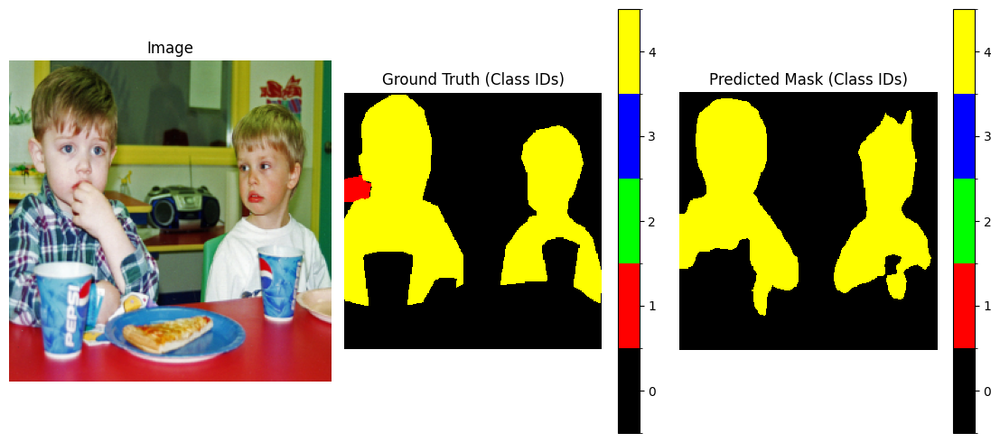

Unique values in predicted mask for image 1: [0 4]


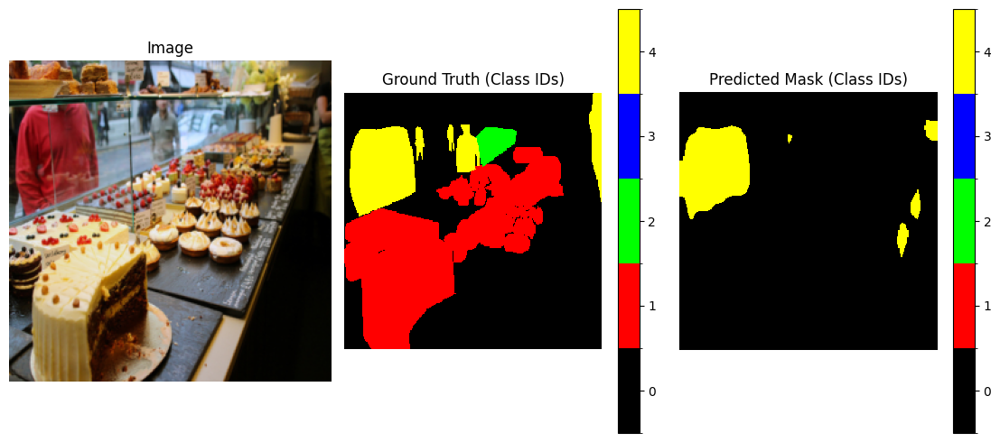

Unique values in predicted mask for image 2: [0 2 4]


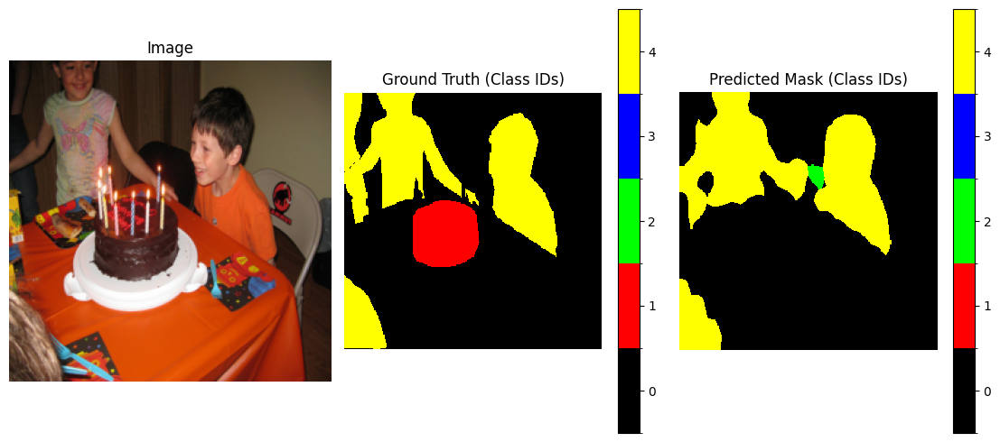

Unique values in predicted mask for image 3: [0]


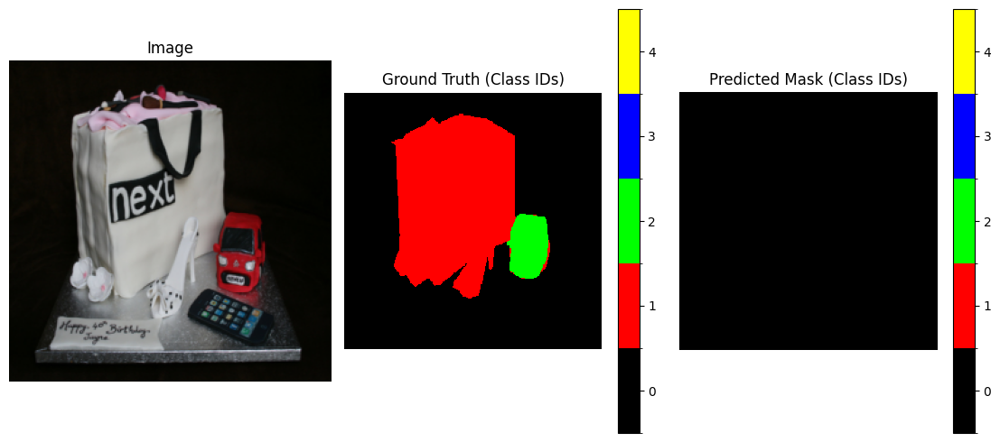

In [ ]:
# Prediction & Visualization with DeepLabV3+
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = len(target_classes) + 1
model = deeplabv3_resnet101(weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1, num_classes=21)
model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=(1, 1), stride=(1, 1))
model.aux_classifier[4] = nn.Conv2d(256, num_classes, kernel_size=(1, 1), stride=(1, 1))
model.load_state_dict(torch.load("best_deeplabv3_model.pth", map_location=device))
model.to(device)
model.eval()

imgs, masks = next(iter(val_loader))
imgs = imgs.to(device)

with torch.no_grad():
    outputs = model(imgs)
    raw_pred_logits = outputs['out'].cpu().detach()
    pred_mask = torch.argmax(raw_pred_logits, dim=1).numpy()


# Define a custom colormap for better visualization of classes
colors = [
    [0, 0, 0],        # 0: Background (Black)
    [255, 0, 0],      # 1: cake (Red)
    [0, 255, 0],      # 2: car (Green)
    [0, 0, 255],      # 3: dog (Blue)
    [255, 255, 0]     # 4: person (Yellow)
]

cmap_custom = plt.cm.colors.ListedColormap(np.array(colors) / 255.0)
bounds = np.arange(num_classes + 1) - 0.5
norm = plt.cm.colors.BoundaryNorm(bounds, cmap_custom.N)


for i in range(len(pred_mask)):
    plt.figure(figsize=(15,5))

    # Original Image
    plt.subplot(1,4,1)
    img_display = imgs[i].cpu().numpy().transpose(1, 2, 0)
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_display = std * img_display + mean
    img_display = np.clip(img_display, 0, 1)
    plt.imshow(img_display)
    plt.title("Image")
    plt.axis("off")

    # Ground Truth Mask
    plt.subplot(1,4,2)
    plt.imshow(masks[i].squeeze().numpy(), cmap=cmap_custom, norm=norm, interpolation='nearest')
    plt.title("Ground Truth (Class IDs)")
    plt.axis("off")
    cbar = plt.colorbar(ticks=np.arange(num_classes))
    cbar.ax.set_yticklabels([str(i) for i in range(num_classes)])


    # Predicted Mask (Class IDs)
    plt.subplot(1,4,3)
    plt.imshow(pred_mask[i], cmap=cmap_custom, norm=norm, interpolation='nearest')
    plt.title("Predicted Mask (Class IDs)")
    plt.axis("off")
    cbar = plt.colorbar(ticks=np.arange(num_classes))
    cbar.ax.set_yticklabels([str(i) for i in range(num_classes)])

    # Print unique values in the predicted mask
    print(f"Unique values in predicted mask for image {i}:", np.unique(pred_mask[i]))

    plt.tight_layout()
    plt.show()

Loaded original model.


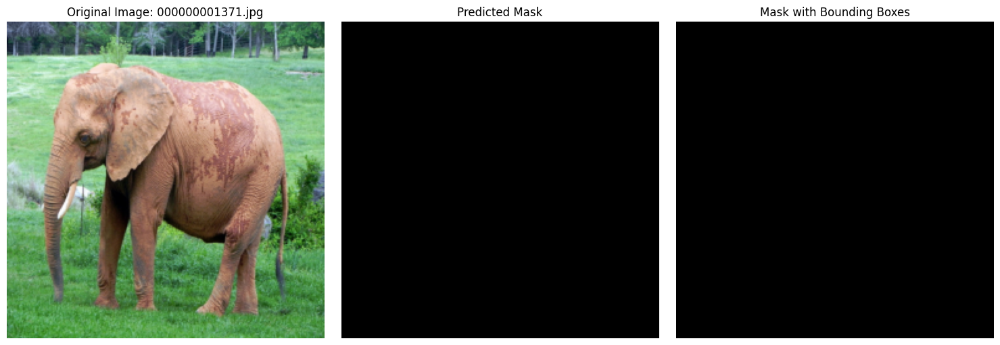

Detected classes in 000000001371.jpg: []


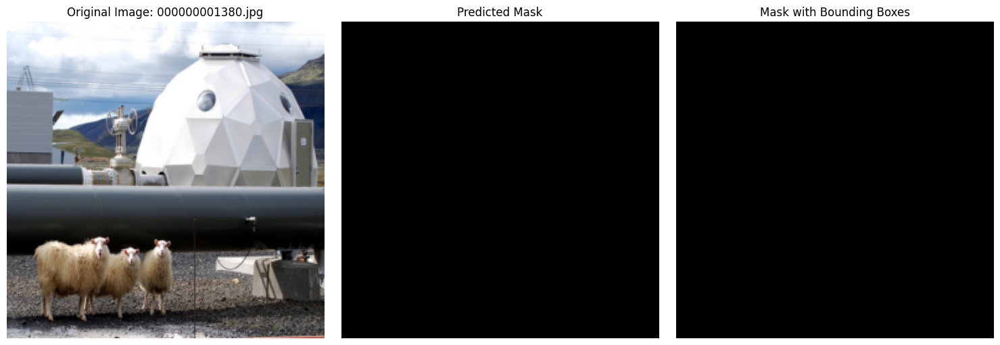

Detected classes in 000000001380.jpg: []


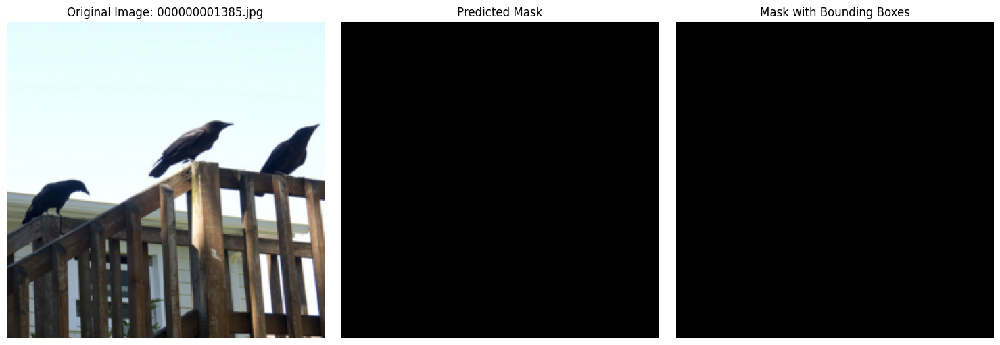

Detected classes in 000000001385.jpg: []


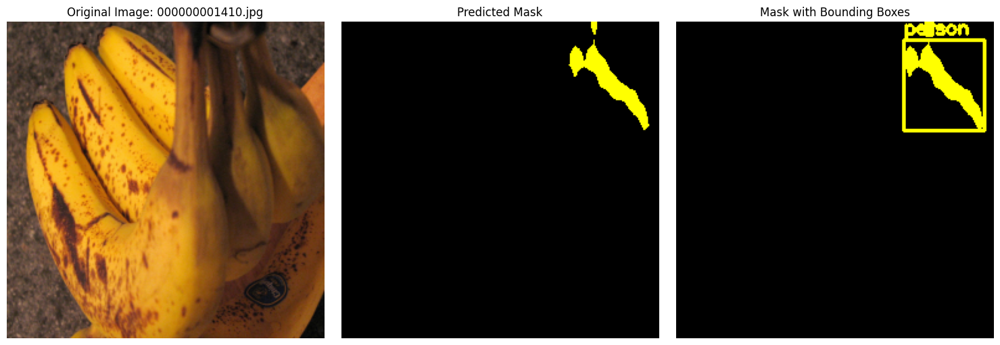

Detected classes in 000000001410.jpg: ['person']


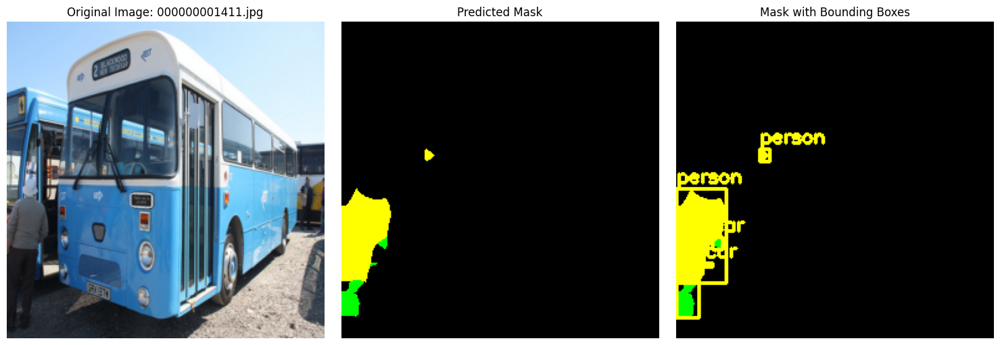

Detected classes in 000000001411.jpg: ['car', 'person']


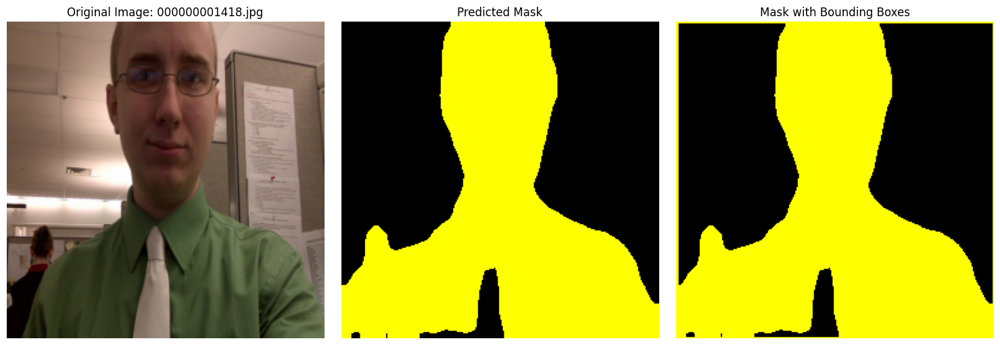

Detected classes in 000000001418.jpg: ['person']


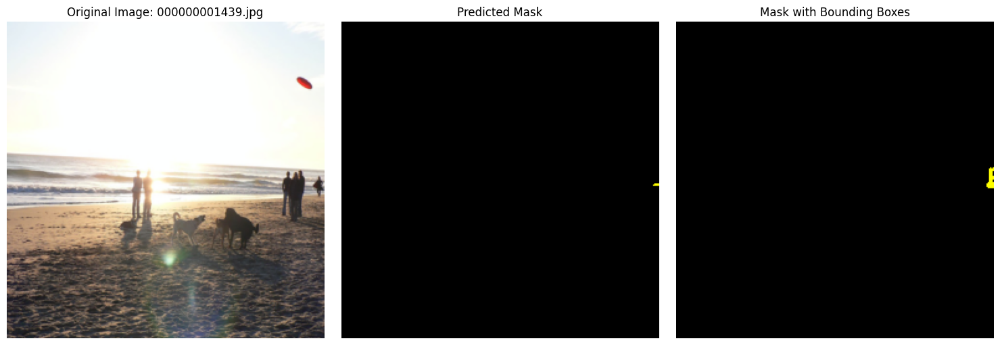

Detected classes in 000000001439.jpg: ['person']


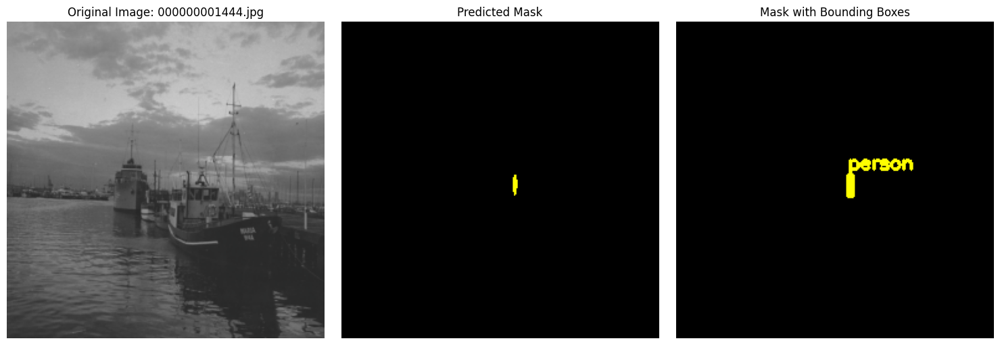

Detected classes in 000000001444.jpg: ['person']


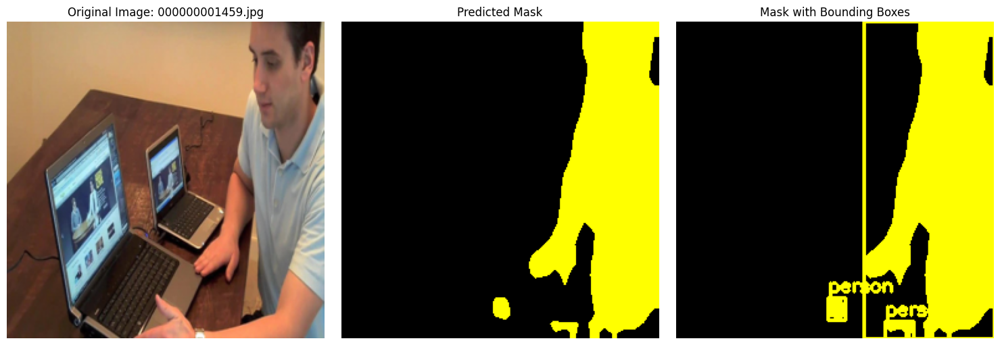

Detected classes in 000000001459.jpg: ['person']


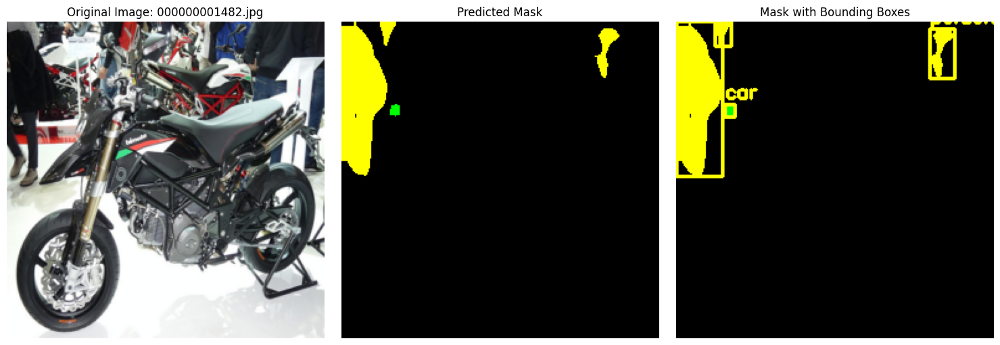

Detected classes in 000000001482.jpg: ['car', 'person']


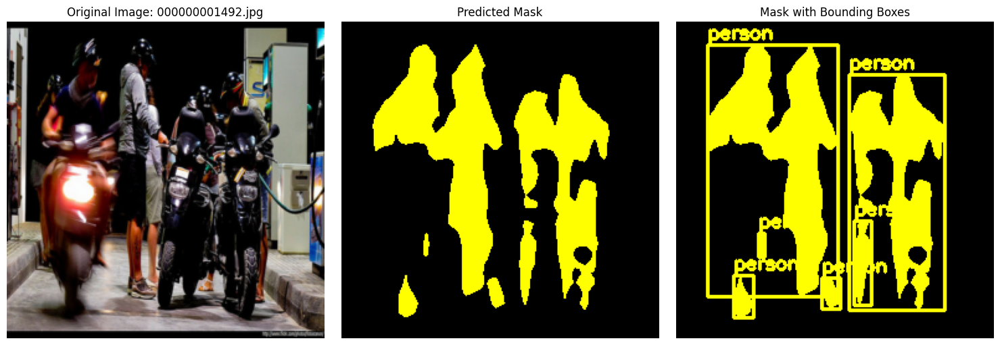

Detected classes in 000000001492.jpg: ['person']


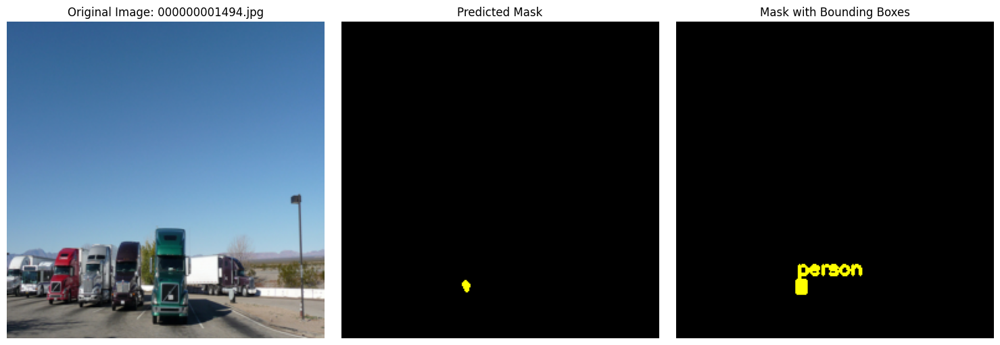

Detected classes in 000000001494.jpg: ['person']


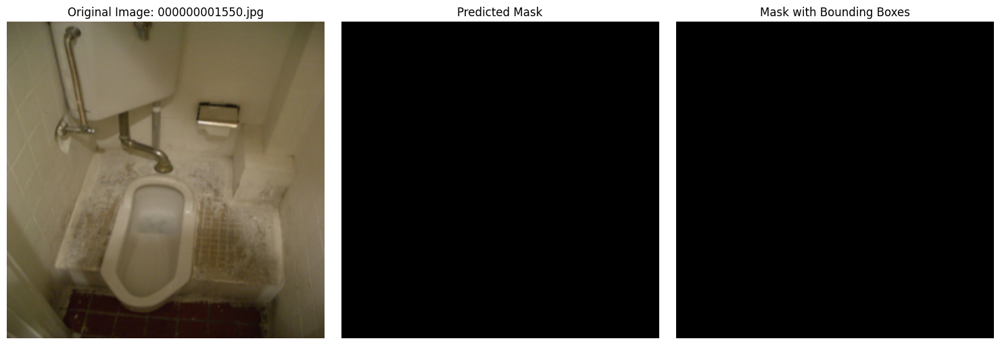

Detected classes in 000000001550.jpg: []


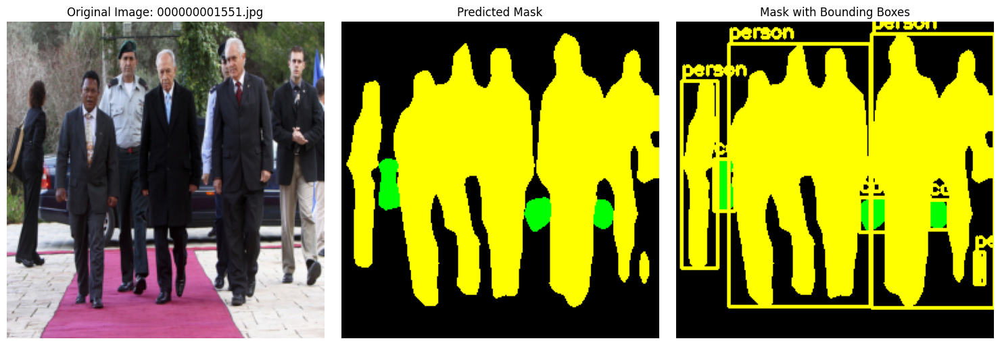

Detected classes in 000000001551.jpg: ['car', 'person']


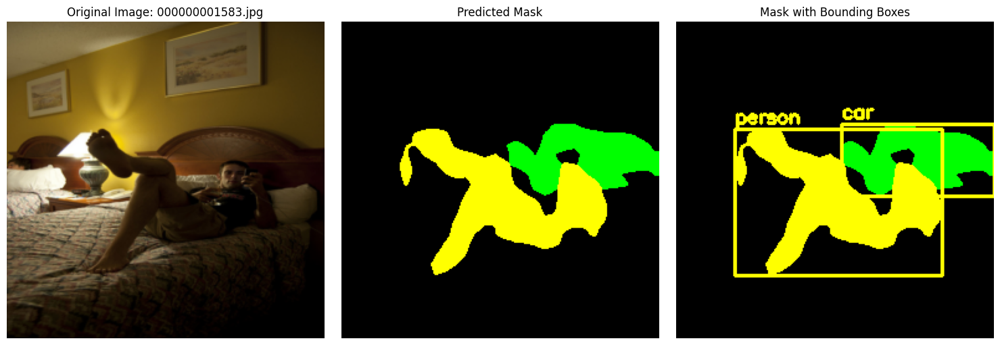

Detected classes in 000000001583.jpg: ['car', 'person']


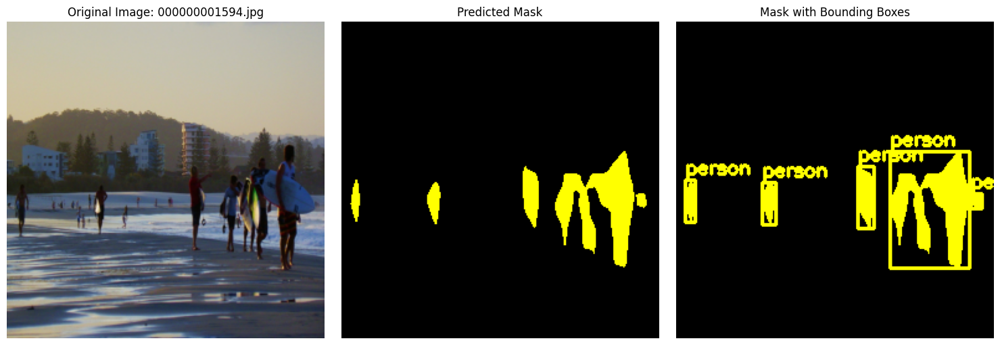

Detected classes in 000000001594.jpg: ['person']


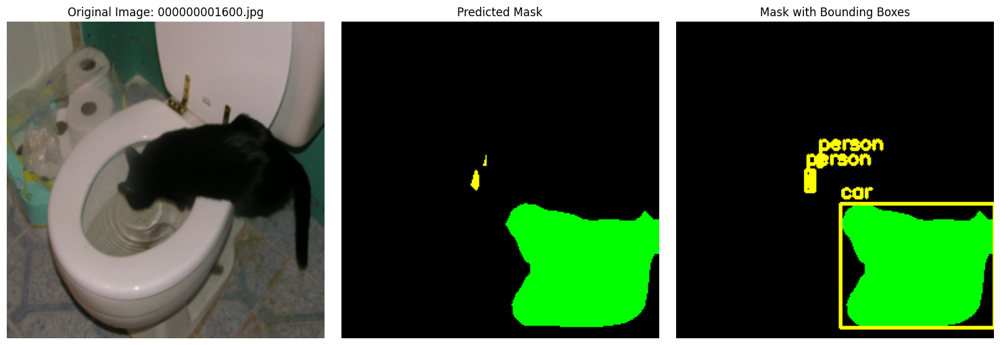

Detected classes in 000000001600.jpg: ['car', 'person']


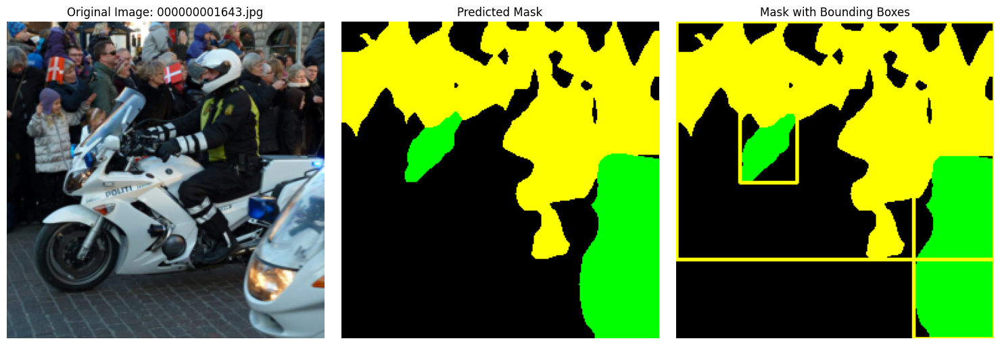

Detected classes in 000000001643.jpg: ['car', 'person']


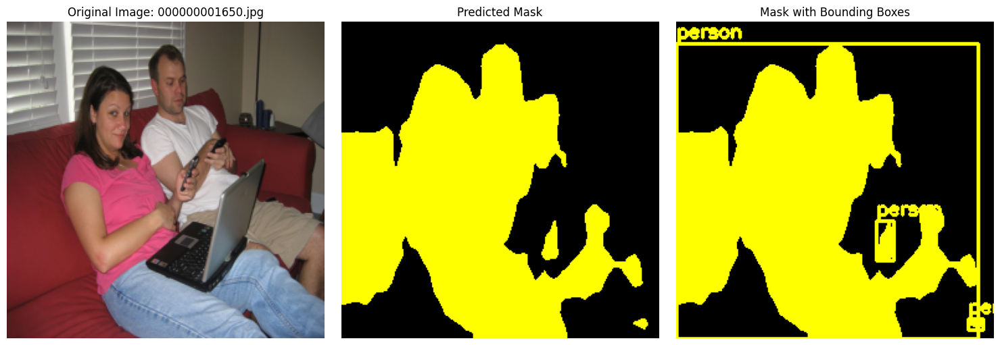

Detected classes in 000000001650.jpg: ['person']


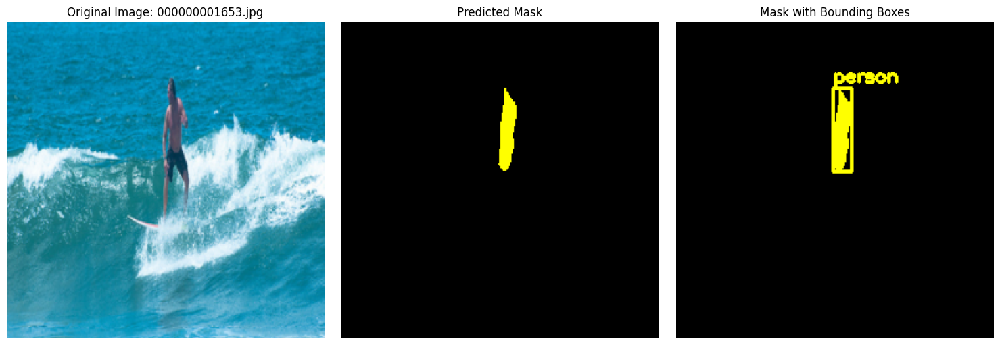

Detected classes in 000000001653.jpg: ['person']


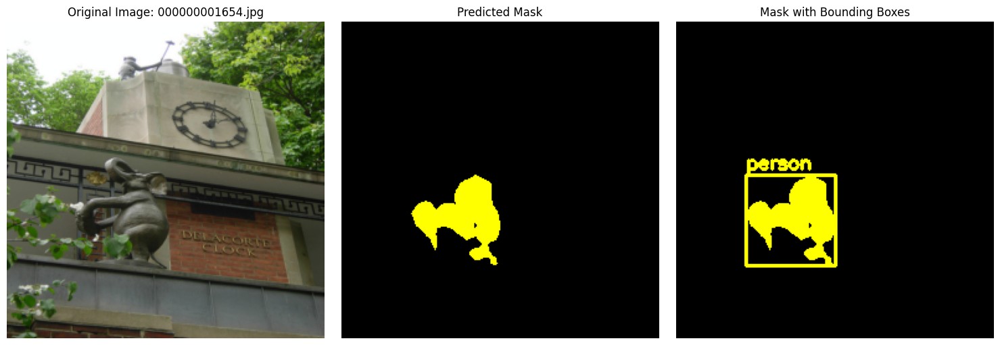

Detected classes in 000000001654.jpg: ['person']


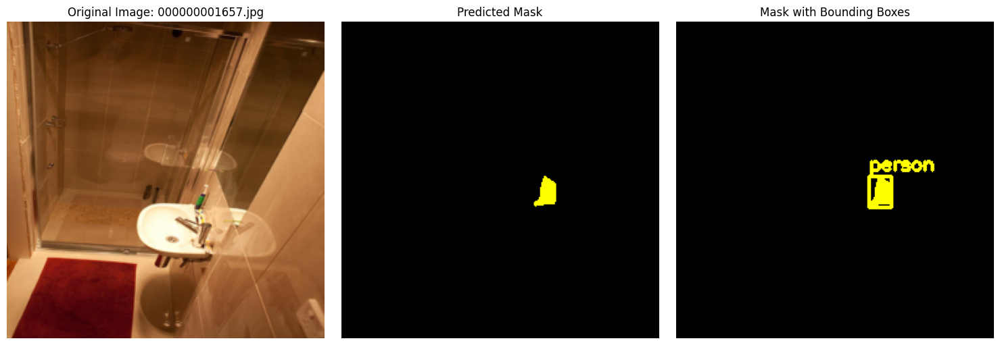

Detected classes in 000000001657.jpg: ['person']


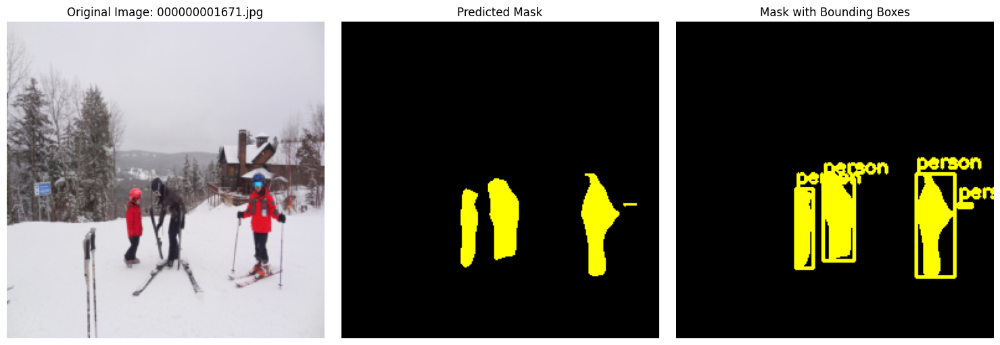

Detected classes in 000000001671.jpg: ['person']


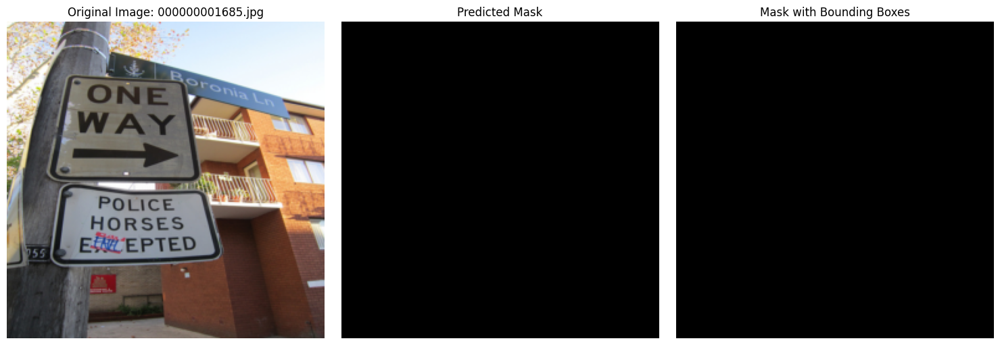

Detected classes in 000000001685.jpg: []


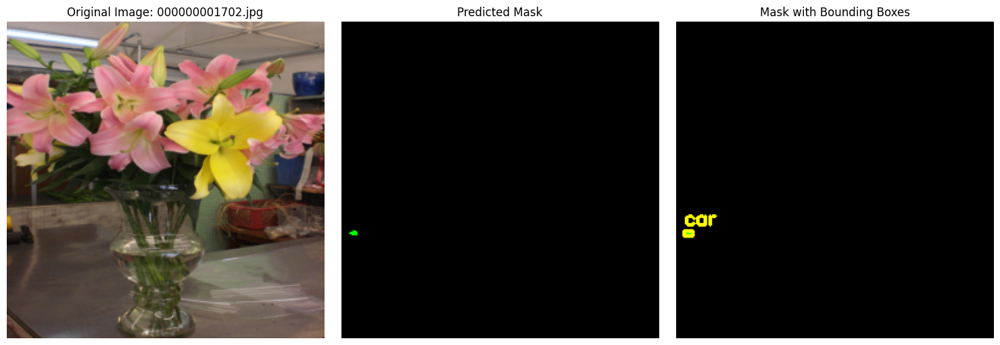

Detected classes in 000000001702.jpg: ['car']


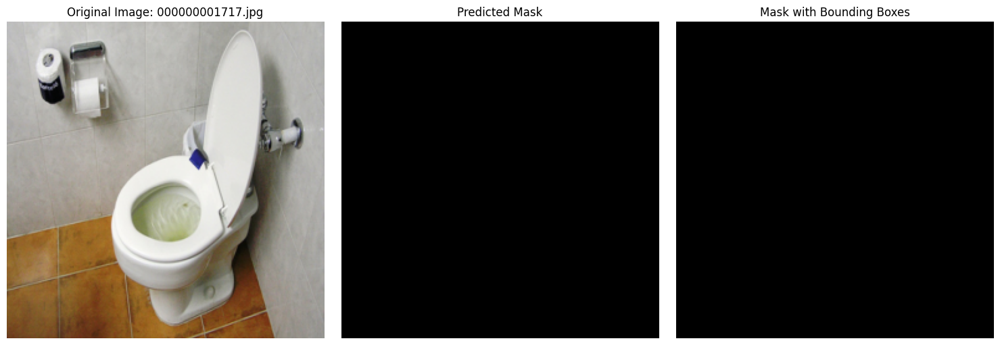

Detected classes in 000000001717.jpg: []


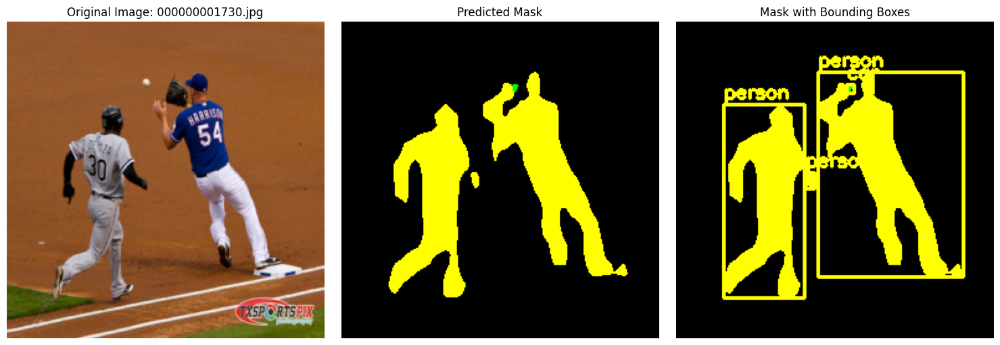

Detected classes in 000000001730.jpg: ['car', 'person']


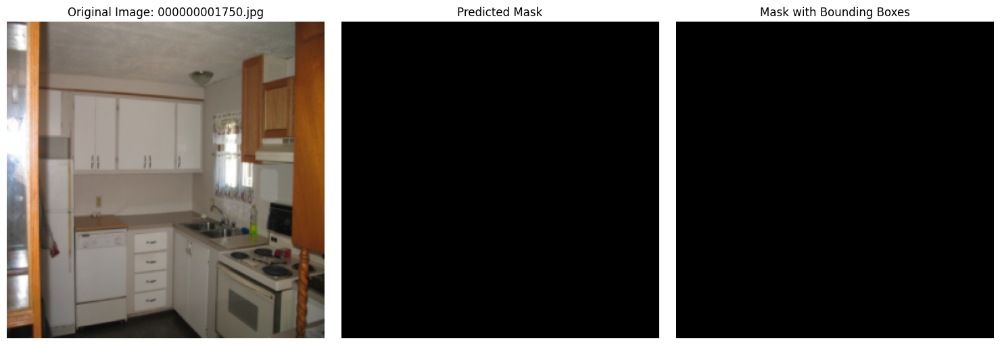

Detected classes in 000000001750.jpg: []


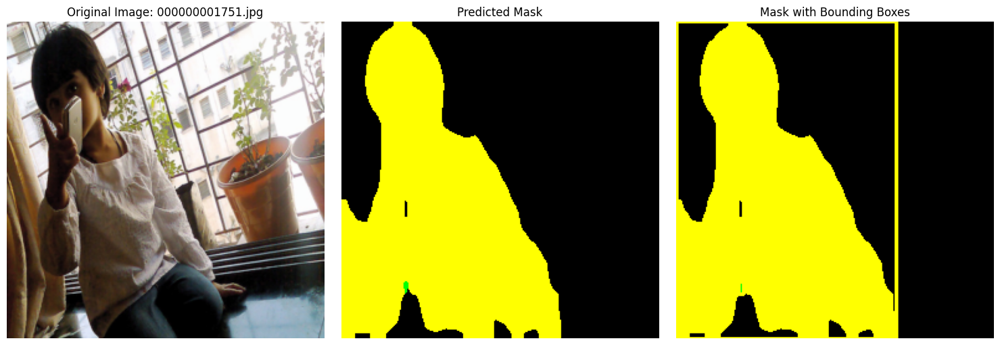

Detected classes in 000000001751.jpg: ['car', 'person']


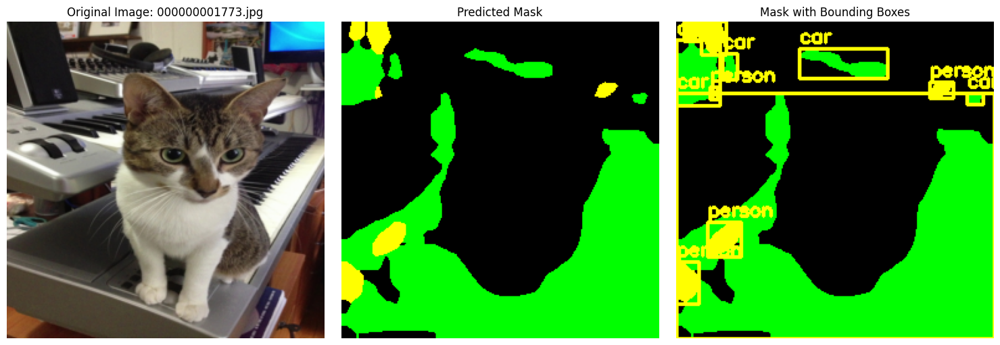

Detected classes in 000000001773.jpg: ['car', 'person']


In [ ]:
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
from PIL import Image
from torchvision.models.segmentation import deeplabv3_resnet101, DeepLabV3_ResNet101_Weights
import torch.nn as nn

# Set up device and paths
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_path = "/content/coco_data/test-30"
target_classes = ['cake', 'car', 'dog', 'person']
class_names = ['background'] + target_classes
num_classes = len(class_names)

# Color map
color_map = {
    1: (255, 0, 0),     # Red - cake
    2: (0, 255, 0),     # Green - car
    3: (0, 0, 255),     # Blue - dog
    4: (255, 255, 0)    # Yellow - person
}

# Define test dataset
class TestImageDataset(Dataset):
    def __init__(self, root, size=(256, 256)):
        self.image_paths = sorted(glob(os.path.join(root, '*')))
        self.transform = T.Compose([
            T.Resize(size),
            T.ToTensor(),
            T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        self.size = size

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        path = self.image_paths[idx]
        img = Image.open(path).convert("RGB")
        original_size = img.size
        img_tensor = self.transform(img)
        return img_tensor, os.path.basename(path), original_size

# Load model
model = deeplabv3_resnet101(weights=DeepLabV3_ResNet101_Weights.COCO_WITH_VOC_LABELS_V1)
model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
model.aux_classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1)
try:
    model.load_state_dict(torch.load("best_deeplabv3_model_weighted.pth", map_location=device))
    print("Loaded weighted model.")
except FileNotFoundError:
    try:
        model.load_state_dict(torch.load("best_deeplabv3_model.pth", map_location=device))
        print("Loaded original model.")
    except FileNotFoundError:
        print("Model checkpoint not found!")
        exit()

model.to(device)
model.eval()

# Inference
test_dataset = TestImageDataset(test_path)
test_loader = DataLoader(test_dataset, batch_size=1)

for img, fname, original_size in test_loader:
    img = img.to(device)

    with torch.no_grad():
        outputs = model(img)
        pred_mask = torch.argmax(outputs['out'], dim=1).squeeze(0).cpu().numpy()

    # Convert image to displayable format
    img_display = img[0].cpu().numpy().transpose(1, 2, 0)
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img_display = np.clip(std * img_display + mean, 0, 1)
    img_display_uint8 = (img_display * 255).astype(np.uint8)

    # Overlay mask with bounding boxes
    pred_mask_rgb = np.zeros_like(img_display_uint8)
    for class_id, color in color_map.items():
        pred_mask_rgb[pred_mask == class_id] = color

    # Draw bounding boxes and labels
    pred_mask_bgr = cv2.cvtColor(pred_mask_rgb, cv2.COLOR_RGB2BGR)
    for class_id in np.unique(pred_mask):
        if class_id == 0:
            continue
        binary_mask = (pred_mask == class_id).astype(np.uint8) * 255
        contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for cnt in contours:
            x, y, w, h = cv2.boundingRect(cnt)
            cv2.rectangle(pred_mask_bgr, (x, y), (x + w, y + h), (0, 255, 255), 2)
            cv2.putText(pred_mask_bgr, class_names[class_id], (x, y - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 255), 2)

    pred_mask_with_boxes = cv2.cvtColor(pred_mask_bgr, cv2.COLOR_BGR2RGB)

    # Plot
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(img_display)
    plt.title(f"Original Image: {fname[0]}")
    plt.axis("off")

    # Segmentation Mask
    plt.subplot(1, 3, 2)
    plt.imshow(pred_mask_rgb)
    plt.title("Predicted Mask")
    plt.axis("off")

    # Mask with Bounding Boxes
    plt.subplot(1, 3, 3)
    plt.imshow(pred_mask_with_boxes)
    plt.title("Mask with Bounding Boxes")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

    print(f"Detected classes in {fname[0]}:", [class_names[c] for c in np.unique(pred_mask) if c != 0])
